<a href="https://colab.research.google.com/gist/SeetaramarajuP/14993fc983f4a6c4016e414058eb86eb/assignment-11-text-mining.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Elon Musk

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import string
import spacy
from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
import seaborn as sns

In [3]:
tweet=pd.read_csv('Elon_musk.csv',encoding='Latin-1')
tweet

,Unnamed: 0,Text
0,1,@kunalb11 Im an alien
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,3,@joerogan @Spotify Great interview!
3,4,@gtera27 Doge is underestimated
4,5,@teslacn Congratulations Tesla China for amazi...
...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n..."
1995,1996,@PPathole Make sure to read ur terms &amp; con...
1996,1997,@TeslaGong @PPathole Samwise Gamgee
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [4]:
tweet.drop(['Unnamed: 0'],inplace=True,axis=1)
tweet

,Text
0,@kunalb11 Im an alien
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated
4,@teslacn Congratulations Tesla China for amazi...
...,...
1994,"@flcnhvy True, it sounds so surreal, but the n..."
1995,@PPathole Make sure to read ur terms &amp; con...
1996,@TeslaGong @PPathole Samwise Gamgee
1997,@PPathole Altho Dumb and Dumber is <U+0001F525...


AttributeError: ignored

In [5]:
tweet=[Text.strip() for Text in tweet.Text]
tweet=[Text for Text in tweet if Text]
tweet[0:10]

['@kunalb11 I\x92m an alien',
 '@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated',
 '@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!',
 'Happy New Year of the Ox! https://t.co/9WFKMYu2oj',
 'Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM',
 '@OwenSparks_ @flcnhvy @anonyx10 Haha thanks :)',
 '@flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely']

In [6]:
text=' '.join(tweet)
text

'@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it? @joerogan @Spotify Great interview! @gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!! Happy New Year of the Ox! https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation. The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock my account @AstroJordy <U+0001F923><U

In [8]:
from nltk.tokenize import TweetTokenizer
tknzr = TweetTokenizer(strip_handles=True)
tweets_tokens=tknzr.tokenize(text)
print(tweets_tokens)

['I', '\x92', 'm', 'an', 'alien', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'next-level', '.', 'Have', 'you', 'tried', 'it', '?', 'Great', 'interview', '!', 'Doge', 'is', 'underestimated', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', '.', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', '!', '!', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', '!', 'https://t.co/9WFKMYu2oj', 'Frodo', 'was', 'the', 'underdoge', ',', 'All', 'thought', 'he', 'would', 'fail', ',', 'Himself', 'most', 'of', 'all', '.', 'https://t.co/zGxJFDzzrM', 'Haha', 'thanks', ':)', 'Indeed', '!', 'Tweets', 'definitely', 'do', 'not', 'represent', 'real-world', 'time', 'allocation', '.', 'The', 'most', 'entertaining', 'outcome', 'is', 'the', 'most', 'likely', 'Just', 'sent', 'some', 'Just', 'agree', 'to', 'do', 'Clubhouse', 'with', 'https://t.co/3rWE9uHSTS', 'It', '\x92', 's', 'getting', 'real', 'Bought', 'some', 'Dogecoin', 'for', 'lil', 'X', ',', 'so', 'he', 'can'

In [11]:
tweets_tokens_text=' '.join(tweets_tokens)
tweets_tokens_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is next-level . Have you tried it ? Great interview ! Doge is underestimated Congratulations Tesla China for amazing execution last year . Now on to the next for even more ! ! Happy New Year of the Ox ! https://t.co/9WFKMYu2oj Frodo was the underdoge , All thought he would fail , Himself most of all . https://t.co/zGxJFDzzrM Haha thanks :) Indeed ! Tweets definitely do not represent real-world time allocation . The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with https://t.co/3rWE9uHSTS It \x92 s getting real Bought some Dogecoin for lil X , so he can be a toddler hodler He definitely has issues , but the sentencing seems a bit high Thanks for fixing Please unlock my account <U+0001F923> <U+0001F923> This is true power haha https://t.co/Fc9uhQSd7O Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT : NASA has selected Falcon Heavy to 

In [12]:
no_punc_text=tweets_tokens_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is nextlevel  Have you tried it  Great interview  Doge is underestimated Congratulations Tesla China for amazing execution last year  Now on to the next for even more   Happy New Year of the Ox  httpstco9WFKMYu2oj Frodo was the underdoge  All thought he would fail  Himself most of all  httpstcozGxJFDzzrM Haha thanks  Indeed  Tweets definitely do not represent realworld time allocation  The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with httpstco3rWE9uHSTS It \x92 s getting real Bought some Dogecoin for lil X  so he can be a toddler hodler He definitely has issues  but the sentencing seems a bit high Thanks for fixing Please unlock my account U0001F923 U0001F923 This is true power haha httpstcoFc9uhQSd7O Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT  NASA has selected Falcon Heavy to launch the first two elements of the lunar Ga

In [13]:
import re
no_url_text=re.sub(r'http\S+', '', no_punc_text)
no_url_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is nextlevel  Have you tried it  Great interview  Doge is underestimated Congratulations Tesla China for amazing execution last year  Now on to the next for even more   Happy New Year of the Ox   Frodo was the underdoge  All thought he would fail  Himself most of all   Haha thanks  Indeed  Tweets definitely do not represent realworld time allocation  The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with  It \x92 s getting real Bought some Dogecoin for lil X  so he can be a toddler hodler He definitely has issues  but the sentencing seems a bit high Thanks for fixing Please unlock my account U0001F923 U0001F923 This is true power haha  Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT  NASA has selected Falcon Heavy to launch the first two elements of the lunar Gateway together on one mission   Yes Once we can predict cash flow reason

In [14]:
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')
nltk.download('stopwords')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [15]:
text_tokens=word_tokenize(no_url_text)
print(text_tokens)

['I', '\x92', 'm', 'an', 'alien', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'nextlevel', 'Have', 'you', 'tried', 'it', 'Great', 'interview', 'Doge', 'is', 'underestimated', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', 'Frodo', 'was', 'the', 'underdoge', 'All', 'thought', 'he', 'would', 'fail', 'Himself', 'most', 'of', 'all', 'Haha', 'thanks', 'Indeed', 'Tweets', 'definitely', 'do', 'not', 'represent', 'realworld', 'time', 'allocation', 'The', 'most', 'entertaining', 'outcome', 'is', 'the', 'most', 'likely', 'Just', 'sent', 'some', 'Just', 'agree', 'to', 'do', 'Clubhouse', 'with', 'It', '\x92', 's', 'getting', 'real', 'Bought', 'some', 'Dogecoin', 'for', 'lil', 'X', 'so', 'he', 'can', 'be', 'a', 'toddler', 'hodler', 'He', 'definitely', 'has', 'issues', 'but', 'the', 'sentencing', 'seems', 'a', 'bit', 'high', 'Thanks', 'for', 'fixing',

In [16]:
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')
sw_list = ['\x92','rt','ye','yeah','haha','Yes','U0001F923','I']
my_stop_words.extend(sw_list)
no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)


['alien', 'Ray', 'tracing', 'Cyberpunk', 'HDR', 'nextlevel', 'Have', 'tried', 'Great', 'interview', 'Doge', 'underestimated', 'Congratulations', 'Tesla', 'China', 'amazing', 'execution', 'last', 'year', 'Now', 'next', 'even', 'Happy', 'New', 'Year', 'Ox', 'Frodo', 'underdoge', 'All', 'thought', 'would', 'fail', 'Himself', 'Haha', 'thanks', 'Indeed', 'Tweets', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'The', 'entertaining', 'outcome', 'likely', 'Just', 'sent', 'Just', 'agree', 'Clubhouse', 'It', 'getting', 'real', 'Bought', 'Dogecoin', 'lil', 'X', 'toddler', 'hodler', 'He', 'definitely', 'issues', 'sentencing', 'seems', 'bit', 'high', 'Thanks', 'fixing', 'Please', 'unlock', 'account', 'This', 'true', 'power', 'Any', 'crypto', 'wallet', 'give', 'private', 'keys', 'avoided', 'costs', 'Your', 'app', 'sucks', 'RT', 'NASA', 'selected', 'Falcon', 'Heavy', 'launch', 'first', 'two', 'elements', 'lunar', 'Gateway', 'together', 'one', 'mission', 'Once', 'predict', 'cash', 'flo

In [17]:
lower_words=[Text.lower() for Text in no_stop_tokens]
lower_words[0:20]

['alien',
 'ray',
 'tracing',
 'cyberpunk',
 'hdr',
 'nextlevel',
 'have',
 'tried',
 'great',
 'interview',
 'doge',
 'underestimated',
 'congratulations',
 'tesla',
 'china',
 'amazing',
 'execution',
 'last',
 'year',
 'now']

In [18]:
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
stemmed_tokens[0:20]

['alien',
 'ray',
 'trace',
 'cyberpunk',
 'hdr',
 'nextlevel',
 'have',
 'tri',
 'great',
 'interview',
 'doge',
 'underestim',
 'congratul',
 'tesla',
 'china',
 'amaz',
 'execut',
 'last',
 'year',
 'now']

In [19]:
nlp=spacy.load('en_core_web_sm')

In [20]:
doc=nlp(' '.join(no_stop_tokens))
doc[0:20]

alien Ray tracing Cyberpunk HDR nextlevel Have tried Great interview Doge underestimated Congratulations Tesla China amazing execution last year Now

In [21]:
lemma=[no_stop_tokens.lemma_ for no_stop_tokens in doc]
print(lemma[0:20])

['alien', 'Ray', 'trace', 'Cyberpunk', 'HDR', 'nextlevel', 'have', 'try', 'great', 'interview', 'Doge', 'underestimate', 'Congratulations', 'Tesla', 'China', 'amazing', 'execution', 'last', 'year', 'now']


In [22]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer=CountVectorizer()
tweetsVec=vectorizer.fit_transform(lemma)
vectorizer.vocabulary_

{'alien': 195,
 'ray': 2378,
 'trace': 3051,
 'cyberpunk': 770,
 'hdr': 1370,
 'nextlevel': 1983,
 'have': 1365,
 'try': 3083,
 'great': 1316,
 'interview': 1567,
 'doge': 894,
 'underestimate': 3219,
 'congratulations': 678,
 'tesla': 2956,
 'china': 586,
 'amazing': 218,
 'execution': 1062,
 'last': 1655,
 'year': 3439,
 'now': 2011,
 'next': 1982,
 'even': 1037,
 'happy': 1352,
 'new': 1980,
 'ox': 2112,
 'frodo': 1217,
 'underdoge': 3218,
 'all': 198,
 'thought': 2993,
 'would': 3425,
 'fail': 1096,
 'himself': 1412,
 'haha': 1340,
 'thank': 2967,
 'indeed': 1508,
 'tweet': 3101,
 'definitely': 807,
 'represent': 2444,
 'realworld': 2393,
 'time': 3010,
 'allocation': 200,
 'the': 2972,
 'entertaining': 1007,
 'outcome': 2091,
 'likely': 1712,
 'just': 1611,
 'send': 2587,
 'agree': 179,
 'clubhouse': 616,
 'it': 1587,
 'get': 1277,
 'real': 2388,
 'buy': 503,
 'dogecoin': 896,
 'lil': 1713,
 'toddler': 3021,
 'hodler': 1418,
 'he': 1371,
 'issue': 1586,
 'sentencing': 2592,
 'seem

In [23]:
print(tweetsVec.toarray()[20:50])
print(tweetsVec.toarray().shape)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
(11486, 3459)


In [24]:
vectorizer_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=vectorizer_ngram_range.fit_transform(lemma)

In [25]:
print(bow_matrix_ngram.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matix_ngram=tfidfv_ngram_max_features.fit_transform(lemma)

In [27]:
print(tfidf_matix_ngram.toarray())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


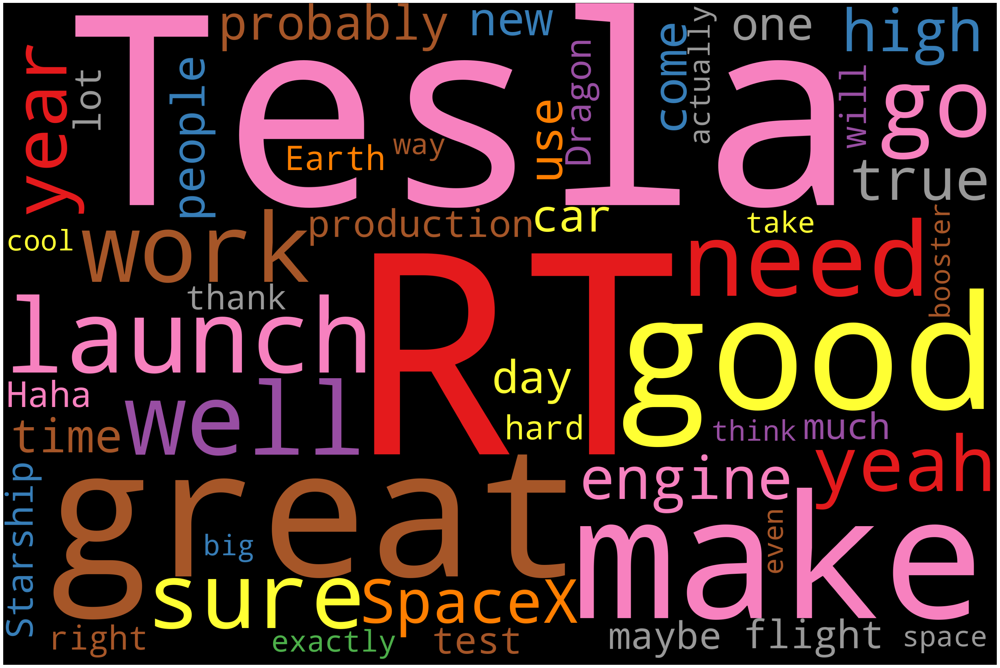

In [28]:
clean_tweets=' '.join(lemma)
clean_tweets
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=50,
                   colormap='Set1',stopwords=STOPWORDS).generate(clean_tweets)
plot_cloud(wordcloud)

In [29]:
nlp=spacy.load('en_core_web_sm')

one_block=clean_tweets
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [30]:
for token in doc_block[200:300]:
    print(token,token.pos_)

booster NOUN
3 NUM
improve VERB
ship NOUN
booster NOUN
mass NOUN
Back PROPN
work NOUN
tonight NOUN
Ð PROPN
Ðogecoin PROPN
Instructional PROPN
video NOUN
the DET
people NOUN
speak VERB
so ADV
cute VERB
U0001F495 PROPN
extremely ADV
misleading ADJ
image NOUN
reflect VERB
true ADJ
time NOUN
cost NOUN
people NOUN
rain VERB
pain NOUN
u0001f3b6 NOUN
who PRON
let VERB
Doge PROPN
U0001F3B6 PROPN
hodl ADJ
rainforest NOUN
so ADV
finally ADV
come VERB
it PRON
fun ADV
crypto VERB
its PRON
simplicity NOUN
genius NOUN
Yup INTJ
true ADJ
not PART
easy ADJ
this DET
two NUM
decade NOUN
intense ADJ
work NOUN
have AUX
look VERB
old ADJ
note NOUN
email NOUN
text NOUN
Lessons NOUN
learn VERB
of ADP
Earth PROPN
Mars PROPN
Time PROPN
tell VERB
story NOUN
Tesla PROPN
SpaceX PROPN
have AUX
read VERB
it PRON
great ADJ
the DET
second ADJ
Last ADJ
Kingdom PROPN
Haven PROPN
hear VERB
name NOUN
year NOUN
Dogecake PROPN
YOLT PROPN
that SCONJ
Damian PROPN
yeah INTJ
sure INTJ
the DET
great ADJ
thing NOUN
restaurant NOU

In [31]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(tweet))
sentences

['@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level.',
 'Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year.',
 'Now on to the next for even more!!',
 'Happy New Year of the Ox!',
 'https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all.',
 'https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed!',
 'Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock 

In [32]:
sentence_df=pd.DataFrame(sentences,columns=['sentence'])
sentence_df

,sentence
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...
1,Have you tried it?
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated @teslacn Congr...
4,Now on to the next for even more!!
...,...
922,"@kenyanwalstreet Not actually a payout, just a..."
923,"It may never pay out, as the stock cant b ht..."
924,Details Aug 28.
925,AI symbiosis while u wait @vistacruiser7 @flcn...


In [33]:
affin=pd.read_csv('Afinn (1).csv',sep=',',encoding='Latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [34]:
affinity_scores=affin.set_index('word')['value'].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [35]:
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_scores

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [37]:
calculate_sentiment(text='abandon')

-2

In [38]:
sentence_df['sentiment_value']=sentence_df['sentence'].apply(calculate_sentiment)
sentence_df['sentiment_value']

0      0
1      0
2      3
3      3
4      0
      ..
922    0
923   -4
924    0
925   -2
926    0
Name: sentiment_value, Length: 927, dtype: int64

In [ ]:
sentence_df['word_count']=sentence_df['sentence'].str.split().apply(len)
sentence_df['word_count']

0      13
1       4
2       4
3      13
4       8
       ..
922    11
923    31
924     3
925    47
926    15
Name: word_count, Length: 927, dtype: int64

In [39]:
sentence_df.sort_values(by='sentiment_value')

,sentence,sentiment_value
840,Cool Model 3 review by @iamjamiefoxx https://t...,-8
650,Very ba https://t.co/tJsh1Exz1Q @justpaulinel...,-8
64,"Also, the road to hell is mostly paved with ba...",-7
923,"It may never pay out, as the stock cant b ht...",-4
683,"Occasional flights from land are ok, but frequ...",-4
...,...,...
648,Its https://t.co/IxhyT6NuiC @Teslarati Tesla...,13
588,The open areas https://t.co/rabjKrtQlw @Sav...,14
105,@Erdayastronaut @SpaceX Was also thinking that...,16
36,"@ajtourville @Erdayastronaut @SpaceX Yes, but ...",16


In [40]:
sentence_df[sentence_df['sentiment_value']<=0]

,sentence,sentiment_value
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,0
1,Have you tried it?,0
4,Now on to the next for even more!!,0
5,Happy New Year of the Ox!,0
6,https://t.co/9WFKMYu2oj Frodo was the underdog...,-2
...,...,...
922,"@kenyanwalstreet Not actually a payout, just a...",0
923,"It may never pay out, as the stock cant b ht...",-4
924,Details Aug 28.,0
925,AI symbiosis while u wait @vistacruiser7 @flcn...,-2


In [41]:
sentence_df[sentence_df['sentiment_value']>0]

,sentence,sentiment_value
2,@joerogan @Spotify Great interview!,3
3,@gtera27 Doge is underestimated @teslacn Congr...,3
7,https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy ...,2
9,The most entertaining outcome is the most like...,3
17,Back to work I go @CapybaraSurfer @MattWallace...,4
...,...,...
914,He was one of the very best.,3
916,"@Ali_Afshari In general, we need to improve ho...",4
918,"@burakaydik True Wow, IHOP &amp; GitHub are cl...",3
920,This is both great &amp; terrifying.,3


<ipython-input-42-c46f2fdaee32>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(sentence_df['sentiment_value'])


<Axes: xlabel='sentiment_value', ylabel='Density'>

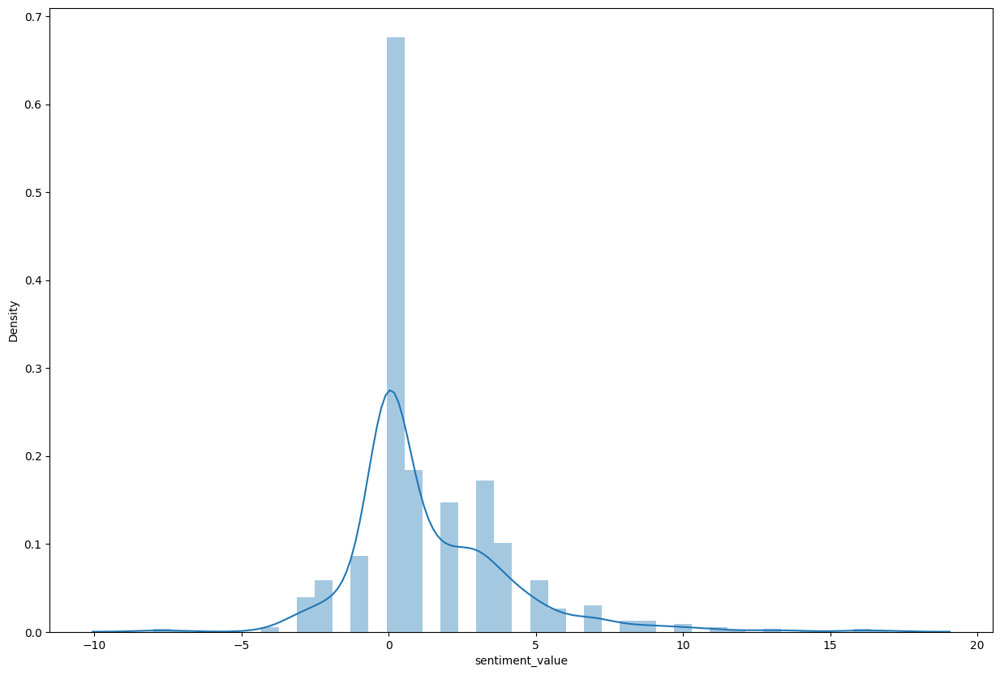

In [42]:

plt.figure(figsize=(15,10))
sns.distplot(sentence_df['sentiment_value'])

In [43]:
sentence_df['index']=range(0,len(sentence_df))
sentence_df

,sentence,sentiment_value,index
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,0,0
1,Have you tried it?,0,1
2,@joerogan @Spotify Great interview!,3,2
3,@gtera27 Doge is underestimated @teslacn Congr...,3,3
4,Now on to the next for even more!!,0,4
...,...,...,...
922,"@kenyanwalstreet Not actually a payout, just a...",0,922
923,"It may never pay out, as the stock cant b ht...",-4,923
924,Details Aug 28.,0,924
925,AI symbiosis while u wait @vistacruiser7 @flcn...,-2,925


<Axes: xlabel='index', ylabel='sentiment_value'>

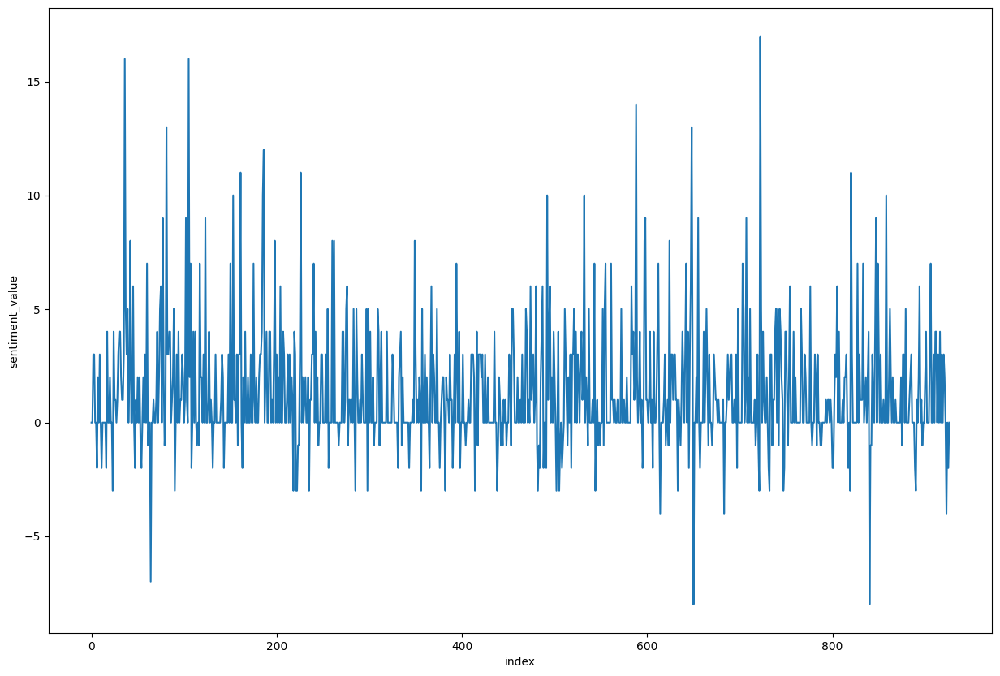

In [44]:
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_value',x='index',data=sentence_df)

# Question 2


In [82]:
shoe=pd.read_csv('amazon_uk_shoes_products_dataset_2021_12.csv')
shoe

,url,product_name,reviewer_name,review_title,review_text,review_rating,verified_purchase,review_date,helpful_count,uniq_id,scraped_at
0,https://www.amazon.co.uk/dp/B07SBX32T5,Klasified Women's Transparent Clear Sneaker Sh...,Jocelyn McSayles,Love em,Love these. Was looking for converses and thes...,5.0,True,Reviewed in the United States on 2 June 2020,2 people found this helpful,36eae4e5-2894-5279-a0b7-d2b330e2b814,24/12/2021 02:26:25
1,https://www.amazon.co.uk/dp/B07SBX32T5,Klasified Women's Transparent Clear Sneaker Sh...,Kenia Rivera,The plastic ripped,"The shoes are very cute, but after the 2nd day...",2.0,True,Reviewed in the United States on 28 October 2021,NaN,f4778bb8-3070-5cb1-b5aa-ffce41a97b57,24/12/2021 02:26:25
2,https://www.amazon.co.uk/dp/B07SBX32T5,Klasified Women's Transparent Clear Sneaker Sh...,Chris Souza,Good quality,Good quality,5.0,True,Reviewed in the United States on 20 January 2021,NaN,db5a7525-d40b-5265-84d8-df4f29837a3b,24/12/2021 02:26:25
3,https://www.amazon.co.uk/dp/B07SBX32T5,Klasified Women's Transparent Clear Sneaker Sh...,Amazon Customer,Good,Great,5.0,True,Reviewed in the United States on 22 April 2021,NaN,75a42851-6462-54b5-988a-27d336221943,24/12/2021 02:26:25
4,https://www.amazon.co.uk/dp/B08SW434MG,"GUESS Women's Bradly Gymnastics Shoe, White, 7 UK",Graziella,PERFETTE!!,Ho scelto il modello bianco con rifinitura die...,5.0,True,Reviewed in Italy on 2 April 2021,2 people found this helpful,232dee43-849e-5d06-ba05-efb3f4814714,24/12/2021 02:26:25
...,...,...,...,...,...,...,...,...,...,...,...
2259,https://www.amazon.co.uk/dp/B08CZ5C51T,adidas unisex child Lite Racer Adapt 4.0 Runni...,lnik,Awesome shoes,Got for my 8 year old. Love them.,5.0,True,Reviewed in the United States on 18 April 2021,5 people found this helpful,b1fb32ab-1f74-59e9-9966-2fe9015e5da8,24/12/2021 02:27:32
2260,https://www.amazon.co.uk/dp/B08CZ5C51T,adidas unisex child Lite Racer Adapt 4.0 Runni...,Tara Sill,Perfect for my 10-year-old,They’re comfortable and easy to put on. And s...,5.0,True,Reviewed in the United States on 4 June 2021,5 people found this helpful,768d66d8-2682-5d65-b077-f2a4f0aaa2d4,24/12/2021 02:27:32
2261,https://www.amazon.co.uk/dp/B08CZ5C51T,adidas unisex child Lite Racer Adapt 4.0 Runni...,Robin,Long enough but narrow,"These shoes seem well made, and the length see...",3.0,True,Reviewed in the United States on 20 December 2021,NaN,19a261d5-d754-5158-a9f3-371a4132c832,24/12/2021 02:27:32
2262,https://www.amazon.co.uk/dp/B08CZ5C51T,adidas unisex child Lite Racer Adapt 4.0 Runni...,Clandon,Comfortable,Second pair to own because they are comfortabl...,5.0,True,Reviewed in the United States on 16 July 2021,3 people found this helpful,7b6655f9-234c-51f1-9f9e-f80dad03810b,24/12/2021 02:27:32


In [83]:
shoes['review']=shoe['review_text']
shoes

0         Love these. Was looking for converses and thes...
1         The shoes are very cute, but after the 2nd day...
2                                              Good quality
3                                                     Great
4         Ho scelto il modello bianco con rifinitura die...
                                ...                        
2260      They’re comfortable and easy to put on.  And s...
2261      These shoes seem well made, and the length see...
2262      Second pair to own because they are comfortabl...
2263      They fit well and are comfortable. My only com...
review    0       Love these. Was looking for converses ...
Name: review_text, Length: 2265, dtype: object

In [65]:
shoe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2264 entries, 0 to 2263
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   url                2264 non-null   object 
 1   product_name       2264 non-null   object 
 2   reviewer_name      2264 non-null   object 
 3   review_title       2264 non-null   object 
 4   review_text        2260 non-null   object 
 5   review_rating      2264 non-null   float64
 6   verified_purchase  2264 non-null   bool   
 7   review_date        2264 non-null   object 
 8   helpful_count      659 non-null    object 
 9   uniq_id            2263 non-null   object 
 10  scraped_at         2263 non-null   object 
dtypes: bool(1), float64(1), object(9)
memory usage: 179.2+ KB


In [66]:
reviews['Text']=shoe['review_text']
reviews

0       Love these. Was looking for converses and thes...
1       The shoes are very cute, but after the 2nd day...
2                                            Good quality
3                                                   Great
4       Ho scelto il modello bianco con rifinitura die...
                              ...                        
2260    They’re comfortable and easy to put on.  And s...
2261    These shoes seem well made, and the length see...
2262    Second pair to own because they are comfortabl...
2263    They fit well and are comfortable. My only com...
Text    0       Love these. Was looking for converses ...
Name: review_text, Length: 2265, dtype: object

In [85]:
reviews=reviews.astype(str)

In [86]:
review_text=' '.join(reviews)
review_text

'Love these. Was looking for converses and these were half the price and so unique— I’ve never seen clear shoes like these; they fit great. The plastic takes a little getting used to but the style is so worth it. The shoes are very cute, but after the 2nd day of wearing them the tongue started ripping. After the 3rd day of wearing them the plastic on the side ripped. They could have ripped bc I was wearing them to work and I do a lot of walking at work. If you’re going to buy these I don’t recommend wearing them on days where you will do a lot of walking or they might rip Good quality Great Ho scelto il modello bianco con rifinitura dietro nera e posso dire che da vicino le scarpe sono ancora più belle, il mio numero è 38, 38.5 ed ho ordinato il numero 38 e mi va bene..Spedizione veloce, il pacco è arrivato anche prima del previsto, prezzo ottimo dato che in giro costano almeno 10, 15 euro in più. Sono solita comprare scarpe Guess e non ho mai avuto problemi con la taglia, in questo ca

In [87]:
no_punc_text=review_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'Love these Was looking for converses and these were half the price and so unique— I’ve never seen clear shoes like these they fit great The plastic takes a little getting used to but the style is so worth it The shoes are very cute but after the 2nd day of wearing them the tongue started ripping After the 3rd day of wearing them the plastic on the side ripped They could have ripped bc I was wearing them to work and I do a lot of walking at work If you’re going to buy these I don’t recommend wearing them on days where you will do a lot of walking or they might rip Good quality Great Ho scelto il modello bianco con rifinitura dietro nera e posso dire che da vicino le scarpe sono ancora più belle il mio numero è 38 385 ed ho ordinato il numero 38 e mi va beneSpedizione veloce il pacco è arrivato anche prima del previsto prezzo ottimo dato che in giro costano almeno 10 15 euro in più Sono solita comprare scarpe Guess e non ho mai avuto problemi con la taglia in questo caso invece mi sono 

In [88]:
review_text_tokens=word_tokenize(no_punc_text)
print(review_text_tokens)

['Love', 'these', 'Was', 'looking', 'for', 'converses', 'and', 'these', 'were', 'half', 'the', 'price', 'and', 'so', 'unique—', 'I', '’', 've', 'never', 'seen', 'clear', 'shoes', 'like', 'these', 'they', 'fit', 'great', 'The', 'plastic', 'takes', 'a', 'little', 'getting', 'used', 'to', 'but', 'the', 'style', 'is', 'so', 'worth', 'it', 'The', 'shoes', 'are', 'very', 'cute', 'but', 'after', 'the', '2nd', 'day', 'of', 'wearing', 'them', 'the', 'tongue', 'started', 'ripping', 'After', 'the', '3rd', 'day', 'of', 'wearing', 'them', 'the', 'plastic', 'on', 'the', 'side', 'ripped', 'They', 'could', 'have', 'ripped', 'bc', 'I', 'was', 'wearing', 'them', 'to', 'work', 'and', 'I', 'do', 'a', 'lot', 'of', 'walking', 'at', 'work', 'If', 'you', '’', 're', 'going', 'to', 'buy', 'these', 'I', 'don', '’', 't', 'recommend', 'wearing', 'them', 'on', 'days', 'where', 'you', 'will', 'do', 'a', 'lot', 'of', 'walking', 'or', 'they', 'might', 'rip', 'Good', 'quality', 'Great', 'Ho', 'scelto', 'il', 'modello',

In [89]:
my_stop_words=stopwords.words('english')
no_stop_tokens=[word for word in review_text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['Love', 'Was', 'looking', 'converses', 'half', 'price', 'unique—', 'I', '’', 'never', 'seen', 'clear', 'shoes', 'like', 'fit', 'great', 'The', 'plastic', 'takes', 'little', 'getting', 'used', 'style', 'worth', 'The', 'shoes', 'cute', '2nd', 'day', 'wearing', 'tongue', 'started', 'ripping', 'After', '3rd', 'day', 'wearing', 'plastic', 'side', 'ripped', 'They', 'could', 'ripped', 'bc', 'I', 'wearing', 'work', 'I', 'lot', 'walking', 'work', 'If', '’', 'going', 'buy', 'I', '’', 'recommend', 'wearing', 'days', 'lot', 'walking', 'might', 'rip', 'Good', 'quality', 'Great', 'Ho', 'scelto', 'il', 'modello', 'bianco', 'con', 'rifinitura', 'dietro', 'nera', 'e', 'posso', 'dire', 'che', 'da', 'vicino', 'le', 'scarpe', 'sono', 'ancora', 'più', 'belle', 'il', 'mio', 'numero', 'è', '38', '385', 'ed', 'ho', 'ordinato', 'il', 'numero', '38', 'e', 'mi', 'va', 'beneSpedizione', 'veloce', 'il', 'pacco', 'è', 'arrivato', 'anche', 'prima', 'del', 'previsto', 'prezzo', 'ottimo', 'dato', 'che', 'giro', 'cost

In [90]:
lower_words=[Review.lower() for Review in no_stop_tokens]
lower_words

['love',
 'was',
 'looking',
 'converses',
 'half',
 'price',
 'unique—',
 'i',
 '’',
 'never',
 'seen',
 'clear',
 'shoes',
 'like',
 'fit',
 'great',
 'the',
 'plastic',
 'takes',
 'little',
 'getting',
 'used',
 'style',
 'worth',
 'the',
 'shoes',
 'cute',
 '2nd',
 'day',
 'wearing',
 'tongue',
 'started',
 'ripping',
 'after',
 '3rd',
 'day',
 'wearing',
 'plastic',
 'side',
 'ripped',
 'they',
 'could',
 'ripped',
 'bc',
 'i',
 'wearing',
 'work',
 'i',
 'lot',
 'walking',
 'work',
 'if',
 '’',
 'going',
 'buy',
 'i',
 '’',
 'recommend',
 'wearing',
 'days',
 'lot',
 'walking',
 'might',
 'rip',
 'good',
 'quality',
 'great',
 'ho',
 'scelto',
 'il',
 'modello',
 'bianco',
 'con',
 'rifinitura',
 'dietro',
 'nera',
 'e',
 'posso',
 'dire',
 'che',
 'da',
 'vicino',
 'le',
 'scarpe',
 'sono',
 'ancora',
 'più',
 'belle',
 'il',
 'mio',
 'numero',
 'è',
 '38',
 '385',
 'ed',
 'ho',
 'ordinato',
 'il',
 'numero',
 '38',
 'e',
 'mi',
 'va',
 'benespedizione',
 'veloce',
 'il',
 'pacc

In [91]:
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens[50:100])

['work', 'if', '’', 'go', 'buy', 'i', '’', 'recommend', 'wear', 'day', 'lot', 'walk', 'might', 'rip', 'good', 'qualiti', 'great', 'ho', 'scelto', 'il', 'modello', 'bianco', 'con', 'rifinitura', 'dietro', 'nera', 'e', 'posso', 'dire', 'che', 'da', 'vicino', 'le', 'scarp', 'sono', 'ancora', 'più', 'bell', 'il', 'mio', 'numero', 'è', '38', '385', 'ed', 'ho', 'ordinato', 'il', 'numero', '38']


In [92]:
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

love was looking converses half price unique— i ’ never seen clear shoes like fit great the plastic takes little getting used style worth the shoes cute 2nd day wearing tongue started ripping after 3rd day wearing plastic side ripped they could ripped bc i wearing work i lot walking work if ’ going buy i ’ recommend wearing days lot walking might rip good quality great ho scelto il modello bianco con rifinitura dietro nera e posso dire che da vicino le scarpe sono ancora più belle il mio numero è 38 385 ed ho ordinato il numero 38 e mi va benespedizione veloce il pacco è arrivato anche prima del previsto prezzo ottimo dato che giro costano almeno 10 15 euro più sono solita comprare scarpe guess e non ho mai avuto problemi con la taglia questo caso invece mi sono arrivate delle scarpe che nonostante fossero il solito numero che prendo sono molto piccole sembra quasi due numeri meno quindi immettibili le scarpe sono molto belle calzano perfettamente semplicemente perfette io uso plantari

In [93]:
lemmas=[review_text_token.lemma_ for review_text_token in doc]
print(lemmas)

['love', 'be', 'look', 'converse', 'half', 'price', 'unique', '—', 'I', "'", 'never', 'see', 'clear', 'shoe', 'like', 'fit', 'great', 'the', 'plastic', 'take', 'little', 'get', 'use', 'style', 'worth', 'the', 'shoe', 'cute', '2nd', 'day', 'wear', 'tongue', 'start', 'rip', 'after', '3rd', 'day', 'wear', 'plastic', 'side', 'rip', 'they', 'could', 'rip', 'bc', 'I', 'wear', 'work', 'I', 'lot', 'walk', 'work', 'if', "'", 'going', 'buy', 'I', "'", 'recommend', 'wear', 'day', 'lot', 'walking', 'might', 'rip', 'good', 'quality', 'great', 'ho', 'scelto', 'il', 'modello', 'bianco', 'con', 'rifinitura', 'dietro', 'nera', 'e', 'posso', 'dire', 'che', 'da', 'vicino', 'le', 'scarpe', 'sono', 'ancora', 'più', 'belle', 'il', 'mio', 'numero', 'è', '38', '385', 'ed', 'ho', 'ordinato', 'il', 'numero', '38', 'e', 'mi', 'va', 'benespedizione', 'veloce', 'il', 'pacco', 'è', 'arrivato', 'anche', 'prima', 'del', 'previsto', 'prezzo', 'ottimo', 'dato', 'che', 'giro', 'costano', 'almeno', '10', '15', 'euro', 'p

In [94]:
clean_review=' '.join(lemmas)
clean_review

'love be look converse half price unique — I \' never see clear shoe like fit great the plastic take little get use style worth the shoe cute 2nd day wear tongue start rip after 3rd day wear plastic side rip they could rip bc I wear work I lot walk work if \' going buy I \' recommend wear day lot walking might rip good quality great ho scelto il modello bianco con rifinitura dietro nera e posso dire che da vicino le scarpe sono ancora più belle il mio numero è 38 385 ed ho ordinato il numero 38 e mi va benespedizione veloce il pacco è arrivato anche prima del previsto prezzo ottimo dato che giro costano almeno 10 15 euro più sono solita comprare scarpe guess e non ho mai avuto problemi con la taglia questo caso invece mi sono arrivate delle scarpe che nonostante fossero il solito numero che prendo sono molto piccole sembra quasi due numeri meno quindi immettibili le scarpe sono molto belle calzano perfettamente semplicemente perfette io uso plantari su misura per piede piatto e dentro 

In [95]:
vectorizer=CountVectorizer()
reviews_v=vectorizer.fit_transform(lemmas)
vectorizer.vocabulary_

{'love': 4769,
 'be': 976,
 'look': 4744,
 'converse': 1873,
 'half': 3772,
 'price': 6137,
 'unique': 8348,
 'never': 5325,
 'see': 7025,
 'clear': 1603,
 'shoe': 7141,
 'like': 4662,
 'fit': 3162,
 'great': 3645,
 'the': 7965,
 'plastic': 5960,
 'take': 7853,
 'little': 4693,
 'get': 3501,
 'use': 8425,
 'style': 7702,
 'worth': 8932,
 'cute': 2017,
 '2nd': 110,
 'day': 2107,
 'wear': 8741,
 'tongue': 8090,
 'start': 7576,
 'rip': 6698,
 'after': 414,
 '3rd': 144,
 'side': 7195,
 'they': 7984,
 'could': 1929,
 'bc': 974,
 'work': 8919,
 'lot': 4764,
 'walk': 8687,
 'if': 4015,
 'going': 3582,
 'buy': 1355,
 'recommend': 6470,
 'walking': 8688,
 'might': 5048,
 'good': 3586,
 'quality': 6320,
 'ho': 3916,
 'scelto': 6889,
 'il': 4025,
 'modello': 5116,
 'bianco': 1128,
 'con': 1783,
 'rifinitura': 6681,
 'dietro': 2313,
 'nera': 5311,
 'posso': 6049,
 'dire': 2344,
 'che': 1525,
 'da': 2038,
 'vicino': 8591,
 'le': 4551,
 'scarpe': 6886,
 'sono': 7426,
 'ancora': 589,
 'più': 5942,
 '

In [96]:
print(reviews_v.toarray()[100:200])
print(reviews_v.toarray().shape)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
(57747, 9218)


In [97]:
vec_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=vec_ngram_range.fit_transform(lemmas)
print(bow_matrix_ngram.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [98]:
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

In [99]:
print(tfidf_matix_ngram.toarray())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


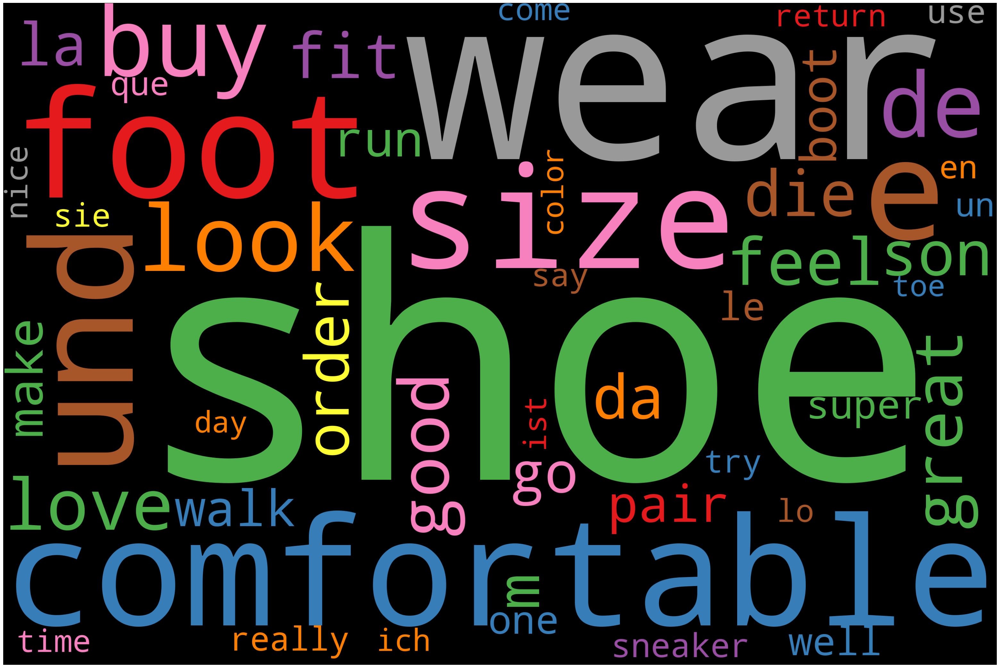

In [100]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=50,
                   colormap='Set1',stopwords=STOPWORDS).generate(clean_review)
plot_cloud(wordcloud)

In [101]:
nlp=spacy.load('en_core_web_sm')
one_block=clean_review
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [102]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(reviews))
sentences

['Love these.',
 'Was looking for converses and these were half the price and so unique— I’ve never seen clear shoes like these; they fit great.',
 'The plastic takes a little getting used to but the style is so worth it.',
 'The shoes are very cute, but after the 2nd day of wearing them the tongue started ripping.',
 'After the 3rd day of wearing them the plastic on the side ripped.',
 'They could have ripped bc I was wearing them to work and I do a lot of walking at work.',
 'If you’re going to buy these I don’t recommend wearing them on days where you will do a lot of walking or they might rip Good quality Great Ho scelto il modello bianco con rifinitura dietro nera e posso dire che da vicino le scarpe sono ancora più belle, il mio numero è 38, 38.5 ed ho ordinato il numero 38 e mi va bene..Spedizione veloce, il pacco è arrivato anche prima del previsto, prezzo ottimo dato che in giro costano almeno 10, 15 euro in più.',
 'Sono solita comprare scarpe Guess e non ho mai avuto problem

In [103]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,Love these.
1,Was looking for converses and these were half ...
2,The plastic takes a little getting used to but...
3,"The shoes are very cute, but after the 2nd day..."
4,After the 3rd day of wearing them the plastic ...
...,...
5667,Was looking for converses and thes...\n1 ...
5668,Love them.
5669,2260 They’re comfortable and easy to put on.
5670,"And s...\n2261 These shoes seem well made, ..."


In [104]:
affin=pd.read_csv('Afinn (1).csv',sep=',',encoding='Latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [105]:
affinity_scores=affin.set_index('word')['value'].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [106]:
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_scores

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [107]:
calculate_sentiment(text='great')

3

In [108]:
sent_df['sentiment_value']=sent_df['sentence'].apply(calculate_sentiment)
sent_df['sentiment_value']

0       3
1       7
2       2
3       2
4       0
       ..
5667    5
5668    3
5669    3
5670    3
5671    0
Name: sentiment_value, Length: 5672, dtype: int64

In [109]:
sent_df['word_count']=sent_df['sentence'].str.split().apply(len)
sent_df['word_count']

0        2
1       23
2       15
3       17
4       13
        ..
5667    39
5668     2
5669     8
5670    28
5671     9
Name: word_count, Length: 5672, dtype: int64

In [110]:
sent_df[sent_df['sentiment_value']<=0]

,sentence,sentiment_value,word_count
4,After the 3rd day of wearing them the plastic ...,0,13
5,They could have ripped bc I was wearing them t...,0,20
7,Sono solita comprare scarpe Guess e non ho mai...,0,50
8,"Io uso plantari su misura per piede piatto, e ...",0,15
9,La scarpa è comoda e da una buona stabilità al...,0,11
...,...,...,...
5658,"However, the band across the foot is extremely...",-2,21
5659,"When he did get his foot in, the shoe was quit...",0,28
5660,"He usually wears regular width shoes, but thes...",0,13
5663,I wear a women's size 6.,0,6


In [111]:
sent_df[sent_df['sentiment_value']>0]

,sentence,sentiment_value,word_count
0,Love these.,3,2
1,Was looking for converses and these were half ...,7,23
2,The plastic takes a little getting used to but...,2,15
3,"The shoes are very cute, but after the 2nd day...",2,17
6,If you’re going to buy these I don’t recommend...,2,87
...,...,...,...
5666,0 Love these.,3,3
5667,Was looking for converses and thes...\n1 ...,5,39
5668,Love them.,3,2
5669,2260 They’re comfortable and easy to put on.,3,8


In [112]:
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,sentiment_value,word_count,index
0,Love these.,3,2,0
1,Was looking for converses and these were half ...,7,23,1
2,The plastic takes a little getting used to but...,2,15,2
3,"The shoes are very cute, but after the 2nd day...",2,17,3
4,After the 3rd day of wearing them the plastic ...,0,13,4
...,...,...,...,...
5667,Was looking for converses and thes...\n1 ...,5,39,5667
5668,Love them.,3,2,5668
5669,2260 They’re comfortable and easy to put on.,3,8,5669
5670,"And s...\n2261 These shoes seem well made, ...",3,28,5670


<ipython-input-113-31ec47e7b788>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(sent_df['sentiment_value'])


<Axes: xlabel='sentiment_value', ylabel='Density'>

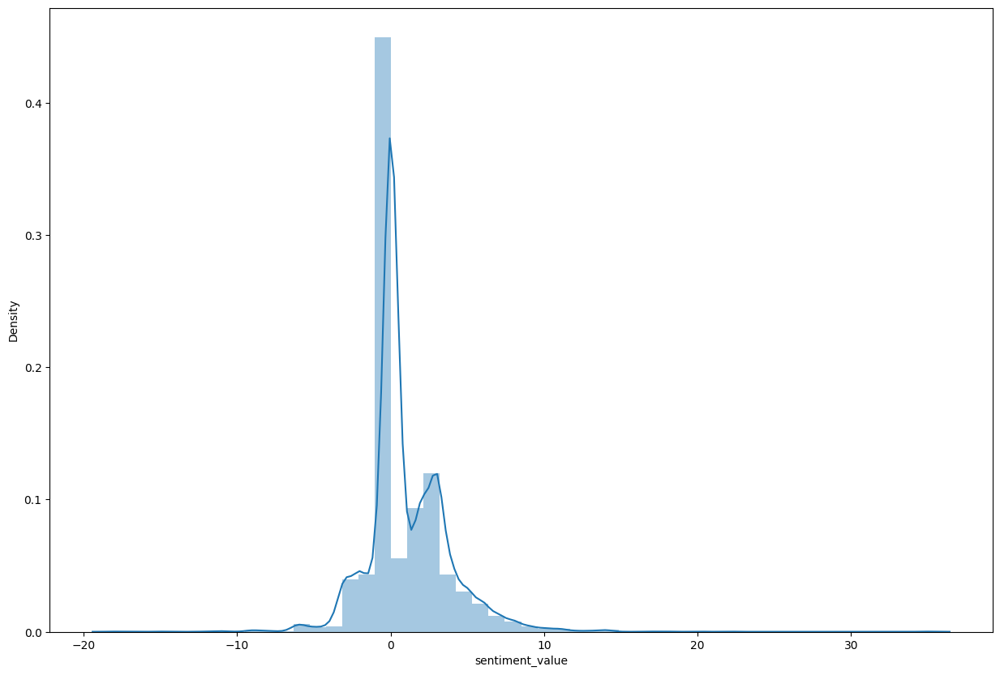

In [113]:
plt.figure(figsize=(15,10))
sns.distplot(sent_df['sentiment_value'])

<Axes: xlabel='index', ylabel='sentiment_value'>

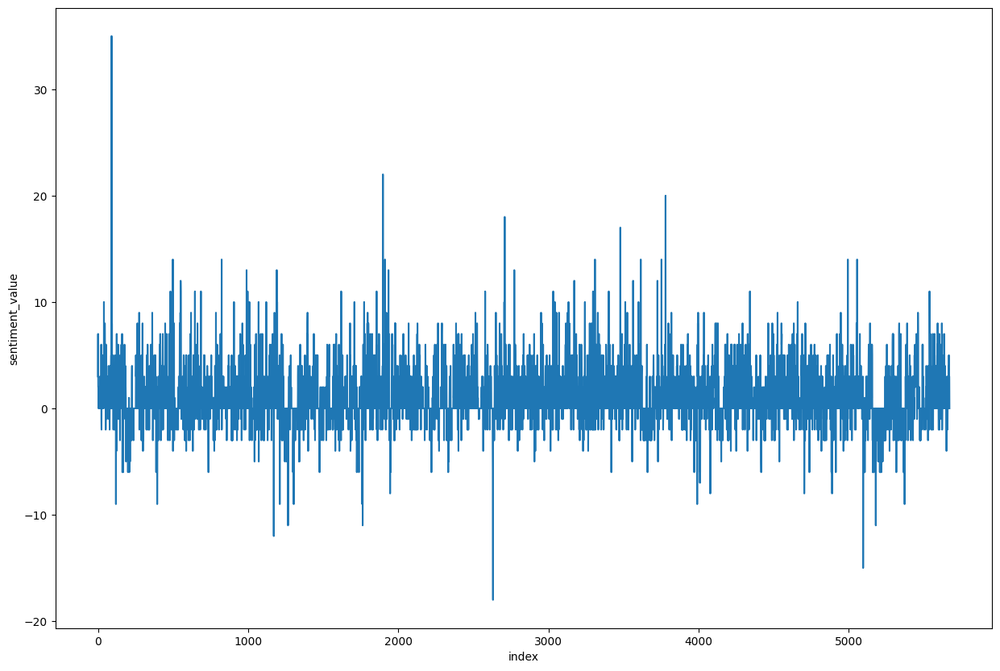

In [114]:
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_value',x='index',data=sent_df)